# Load data with SpatialData, transfer any annotations, run basic processing

The previous annotated data has either '-1' or '-0' appended to cell_id
"-0" = right
"-1" = left

In [1]:
import spatialdata as sd
import spatialdata_plot
import spatialdata_io
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

import anndata as ad
from spatialdata import bounding_box_query
from spatialdata import rasterize

## Organizing data

In [26]:
right = spatialdata_io.xenium("../../data/right_side/")

INFO     reading ../../data/right_side/cell_feature_matrix.h5                                                      


In [27]:
left = spatialdata_io.xenium("../../data/left_side/")

INFO     reading ../../data/left_side/cell_feature_matrix.h5                                                       


In [28]:
right.write("right_data.zarr")
left.write("left_data.zarr")

INFO     The Zarr backing store has been changed from None the new file path: right_data.zarr                      
INFO     The Zarr backing store has been changed from None the new file path: left_data.zarr                       


In [26]:
adata = ad.read_h5ad("../11-Xenium_integration/xenium_filter_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 2405191 × 477
    obs: 'batch', 'Core', 'Size', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'leiden_res2', 'manual_celltype_annotation_leiden_broad', 'manual_celltype_annotation_leiden_broad_split_stromal', 'leiden_res5', 'final_annotation_leiden_res2_broad', 'final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid', 'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id', 'spatial_lda_kmeans', 'motif', 'ct_codex'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cod

In [28]:
left["table"].obs["region"] = "left"
right["table"].obs["region"] = "right"

In [43]:
right.images['morphology_focus_right'] = right.images.pop('morphology_focus')
right.images['morphology_mip_right'] = right.images.pop('morphology_mip')
right.labels['cell_labels_right'] = right.labels.pop('cell_labels')
right.labels['nucleus_labels_right'] = right.labels.pop('nucleus_labels')
right.points['transcripts_right'] = right.points.pop('transcripts')
right.shapes['cell_boundaries_right'] = right.shapes.pop('cell_boundaries')
right.shapes['cell_circles_right'] = right.shapes.pop('cell_circles')
right.shapes['nucleus_boundaries_right'] = right.shapes.pop('nucleus_boundaries')

In [44]:
left.images['morphology_focus_left'] = left.images.pop('morphology_focus')
left.images['morphology_mip_left'] = left.images.pop('morphology_mip')
left.labels['cell_labels_left'] = left.labels.pop('cell_labels')
left.labels['nucleus_labels_left'] = left.labels.pop('nucleus_labels')
left.points['transcripts_left'] = left.points.pop('transcripts')
left.shapes['cell_boundaries_left'] = left.shapes.pop('cell_boundaries')
left.shapes['cell_circles_left'] = left.shapes.pop('cell_circles')
left.shapes['nucleus_boundaries_left'] = left.shapes.pop('nucleus_boundaries')

In [55]:
left['table'].uns['spatialdata_attrs']['region'] = 'cell_circles_left'
right['table'].uns['spatialdata_attrs']['region'] = 'cell_circles_right'

In [56]:
# sdata = sd.concatenate({'1':left, '0':right}, region_key="region")
sdata = sd.concatenate([right, left], concatenate_tables=True)
sdata

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'right', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'left', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


SpatialData object
├── Images
│     ├── 'morphology_focus_left': DataTree[cyx] (1, 98717, 48379), (1, 49358, 24189), (1, 24679, 12094), (1, 12339, 6047), (1, 6169, 3023)
│     ├── 'morphology_focus_right': DataTree[cyx] (1, 105304, 48778), (1, 52652, 24389), (1, 26326, 12194), (1, 13163, 6097), (1, 6581, 3048)
│     ├── 'morphology_mip_left': DataTree[cyx] (1, 98717, 48379), (1, 49358, 24189), (1, 24679, 12094), (1, 12339, 6047), (1, 6169, 3023)
│     └── 'morphology_mip_right': DataTree[cyx] (1, 105304, 48778), (1, 52652, 24389), (1, 26326, 12194), (1, 13163, 6097), (1, 6581, 3048)
├── Labels
│     ├── 'cell_labels_left': DataTree[yx] (98717, 48379), (49358, 24189), (24679, 12094), (12339, 6047), (6169, 3023)
│     ├── 'cell_labels_right': DataTree[yx] (105304, 48778), (52652, 24389), (26326, 12194), (13163, 6097), (6581, 3048)
│     ├── 'nucleus_labels_left': DataTree[yx] (98717, 48379), (49358, 24189), (24679, 12094), (12339, 6047), (6169, 3023)
│     └── 'nucleus_labels_right': Dat

In [63]:
sdata['table'].obs['region'] = sdata['table'].obs['region'].astype('category')

### Updating all the metadata

keep columns:
'Core','Size','leiden','leiden_res2','manual_celltype_annotation_leiden_broad','manual_celltype_annotation_leiden_broad_split_stromal',
'leiden_res5','final_annotation_leiden_res2_broad','final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid',
'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id','spatial_lda_kmeans', 'motif', 'ct_codex'

In [68]:
bc_apdx = {"left":"-1", "right":"-0"}
sdata['table'].obs['cell_id_all'] = sdata['table'].obs.apply(lambda x: x['cell_id']+bc_apdx[x['region']], axis=1)

In [69]:
a = sdata['table'].obs.copy()
b = adata.obs.copy()

In [79]:
keep_cols = ['Core','Size','leiden','leiden_res2','manual_celltype_annotation_leiden_broad','manual_celltype_annotation_leiden_broad_split_stromal',
'leiden_res5','final_annotation_leiden_res2_broad','final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid',
'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id','spatial_lda_kmeans', 'motif', 'ct_codex']
b =b.loc[:, keep_cols]

In [82]:
sdata['table'].obs = pd.merge(a,b, left_on="cell_id_all", right_index=True, how="left")


In [83]:
sdata.write("sd_concat.zarr", overwrite=True)

INFO     The Zarr backing store has been changed from None the new file path: sd_concat.zarr                       


### Filtering

How are the 'core_ids' related to the sample IDs?

filter (and match labels) of bad cores
    - sections to drop: 1,5,10,11,12,13,14
    - ...which are `core_ids` '20','21','22','6','29','28','12','10','11','31','32','30','15'

for filtering, I think I'll have to handle the left and right shapes separately, and the table separate from that
   also, update the attrs...https://spatialdata.scverse.org/en/latest/tutorials/notebooks/notebooks/examples/tables.html

scanpy preprocessing?

normalize data?


In [2]:
sdata = sd.read_zarr("sd_concat.zarr/")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'right', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'left', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


In [4]:
sdata

SpatialData object, with associated Zarr store: /mnt/isilon/cscb/Projects/10x_xenium/pillaiv/code/replicated_analysis/sd_concat.zarr
├── Images
│     ├── 'morphology_focus_left': DataTree[cyx] (1, 98717, 48379), (1, 49358, 24189), (1, 24679, 12094), (1, 12339, 6047), (1, 6169, 3023)
│     ├── 'morphology_focus_right': DataTree[cyx] (1, 105304, 48778), (1, 52652, 24389), (1, 26326, 12194), (1, 13163, 6097), (1, 6581, 3048)
│     ├── 'morphology_mip_left': DataTree[cyx] (1, 98717, 48379), (1, 49358, 24189), (1, 24679, 12094), (1, 12339, 6047), (1, 6169, 3023)
│     └── 'morphology_mip_right': DataTree[cyx] (1, 105304, 48778), (1, 52652, 24389), (1, 26326, 12194), (1, 13163, 6097), (1, 6581, 3048)
├── Labels
│     ├── 'cell_labels_left': DataTree[yx] (98717, 48379), (49358, 24189), (24679, 12094), (12339, 6047), (6169, 3023)
│     ├── 'cell_labels_right': DataTree[yx] (105304, 48778), (52652, 24389), (26326, 12194), (13163, 6097), (6581, 3048)
│     ├── 'nucleus_labels_left': DataTree[yx]

In [28]:
adata.obs.core_id.value_counts()

core_id
8     148594
7     136328
23    128818
17    123581
16    119079
33    115325
27    108735
35    107652
37    107365
14    104667
36    102897
13     98317
9      97044
4      96331
5      96296
25     95441
34     91713
38     90965
19     83926
1      82298
2      80267
18     71636
3      71028
26     46888
Name: count, dtype: int64

In [17]:
print(sdata['table'].obs.X_centroid.max())
print(sdata['table'].obs.Y_centroid.max())

10215.333984375
21973.783203125


In [67]:
sdata['table'].obs.core_id.loc[sdata['table'].obs.region=="left"].unique().tolist()

[nan, '33', '25', '34', '37', '26', '38', '27', '19', '23', '35', '36']

In [49]:
sdata['table'].obs.core_id.loc[sdata['table'].obs.region=="right"].unique().tolist()

['16', nan, '7', '1', '13', '14', '4', '8', '18', '2', '5', '17', '9', '3']

In [20]:
# what scale are the centroid locations relevant to?
#   I think scale2, so I'll try icreasing by 2*2 (for scale 0)

sdata['table'].obs['x_centroid_scale0'] = sdata['table'].obs.X_centroid*4
sdata['table'].obs['y_centroid_scale0'] = sdata['table'].obs.Y_centroid*4

In [42]:
sdata['table'].obs.core_id = sdata['table'].obs.core_id.astype('category')

2060 11901 30076 39907


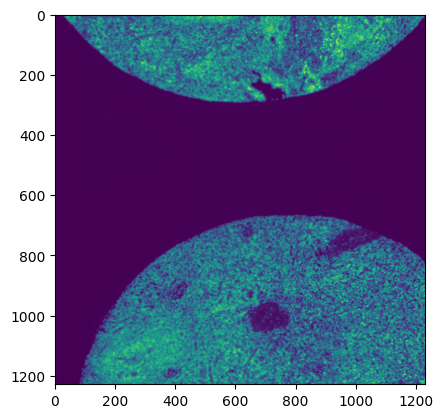

In [37]:
# testing core_id 1
fov = '13'
min_x = int(sdata['table'].obs.x_centroid_scale0.loc[sdata['table'].obs.core_id==fov].min())
max_x = int(sdata['table'].obs.x_centroid_scale0.loc[sdata['table'].obs.core_id==fov].max())
min_y = int(sdata['table'].obs.y_centroid_scale0.loc[sdata['table'].obs.core_id==fov].min())
max_y = int(sdata['table'].obs.y_centroid_scale0.loc[sdata['table'].obs.core_id==fov].max())
def crop0(x, el):
    return bounding_box_query(
        x[el],
        min_coordinate=[min_x, min_y],
        max_coordinate=[max_x, max_y],
        axes=("x", "y"),
        target_coordinate_system="global")

print(min_x, max_x, min_y, max_y)
i_ = crop0(sdata, "morphology_focus_right")
# crop0(sdata, "morphology_focus_right").pl.render_images("morphology_focus_right").pl.show(coordinate_systems="global")
plt.imshow(i_['scale3'].image.as_numpy()[0,...])

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'right', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'left', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'right', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:157: UserWarning: The table is annotating 'left', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


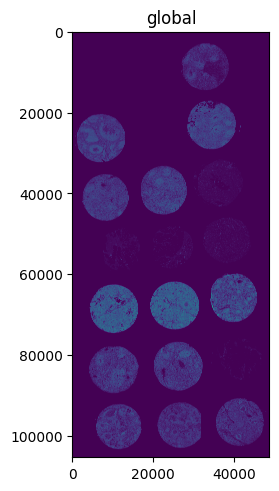

In [14]:
sdata.pl.render_images("morphology_focus_right", scale='scale2').pl.show()


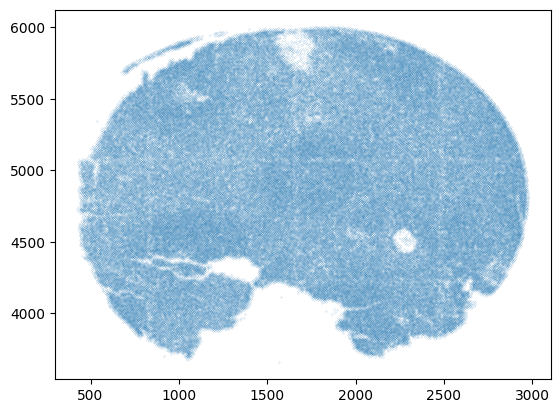

In [71]:
# plt.imshow(i_['scale2'].image.data)
# plt.imshow(i_['scale1'].image.data[0,...])
# sdata.pl.render_shapes('cell_circles_right', color='core_id', groups=['13']).pl.show()
pdata = sdata['table'].obs.loc[sdata['table'].obs.core_id=='33',['X_centroid','Y_centroid']].to_numpy()
plt.scatter(pdata[:,0], pdata[:,1], s=0.01)

In [110]:
# finally! I have this sorted out
bad_cores = ['20','21','22','6','29','28','12','10','11','31','32','30','15']
sample_dict = {
    '2':['19','3'],
    '3':['1','2'],
    '4':['23','24'],
    '6':['5','4'],
    '7':['27','26'],
    '8':['25','9'],
    '9':['7','8'],
    '15':['13','14'],
    '16':['35','34'],
    '17':['33','17'],
    '18':['16'],
    '19':['38','37'],
    '20':['36','18']
}
MCDi = ['2','3','6','7','9','15','16','17','19']
RLNi = ['4','8']
UCDi = ['18','20']

In [10]:
keep_i

{'bmmbmofk-1-0',
 'eagmfidc-1-0',
 'dfpknnkn-1-0',
 'dkfdmppc-1-0',
 'gegafaif-1-0',
 'dbnfobff-1-0',
 'fhpabhdb-1-0',
 'ncjklcfl-1-0',
 'adhihnec-1-1',
 'medkfmlh-1-1',
 'aonlmmmm-1-0',
 'hhcfnjkj-1-0',
 'gaeiljml-1-0',
 'aboimooj-1-0',
 'bpedegaa-1-0',
 'habchalm-1-0',
 'cfeipnpi-1-0',
 'ffnhfhbf-1-0',
 'ilclfogo-1-0',
 'jblnmhdh-1-0',
 'kbhoikoi-1-0',
 'nkadndbi-1-0',
 'afakjnmm-1-1',
 'fihheeld-1-1',
 'obgkhjpd-1-1',
 'agbcajcl-1-0',
 'fjhmhdcp-1-1',
 'mgkmgjae-1-1',
 'imkdikia-1-0',
 'encembmd-1-1',
 'dahlgbpa-1-0',
 'kbemnjid-1-0',
 'dhakndoh-1-1',
 'ldfdaiic-1-0',
 'oafldmhf-1-0',
 'egojmbph-1-0',
 'ldmnjhfg-1-1',
 'fgdehhjf-1-0',
 'cmdmaebl-1-1',
 'kakcoaol-1-1',
 'hbbjbeph-1-1',
 'ceflffnl-1-0',
 'fkkhbfbi-1-1',
 'bbiaccin-1-0',
 'mpbonmgn-1-0',
 'kodlphke-1-0',
 'dckbnepp-1-1',
 'eeeemife-1-1',
 'cmhmjena-1-1',
 'icoeifnd-1-1',
 'hkiinjba-1-1',
 'lfdiblig-1-0',
 'odkchpmk-1-0',
 'dklblcmg-1-0',
 'efgikcnk-1-0',
 'mkfgjboi-1-0',
 'kkalbkdo-1-1',
 'ghodfdgj-1-1',
 'ebellebc-1-1

In [9]:

# get the good cells
keep_i = sdata['table'].obs.cell_id_all.loc[~sdata['table'].obs.X_centroid.isna()].tolist()
keep_i = set(keep_i).intersection(sdata['table'].obs.cell_id_all.loc[~sdata['table'].obs.core_id.isin(bad_cores)])

# adding some new annotations
sdata['table'].obs['sample_id'] = 'unknown'
for key, value in sample_dict.items():
    sdata['table'].obs['sample_id'].loc[sdata['table'].obs.core_id.isin(value)] = key
    
sdata['table'].obs['disease'] = 'unknown'
sdata['table'].obs['disease'].loc[sdata['table'].obs.sample_id.isin(MCDi)] = 'MCD'
sdata['table'].obs['disease'].loc[sdata['table'].obs.sample_id.isin(RLNi)] = 'RLN'
sdata['table'].obs['disease'].loc[sdata['table'].obs.sample_id.isin(UCDi)] = 'UCD'
# len(keep_i)

In [11]:
# filter annotations
sdata['table'] = sdata['table'][sdata['table'].obs.cell_id_all.isin(keep_i),:]


/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/_elements.py:116: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


View of AnnData object with n_obs × n_vars = 2405191 × 477
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels', 'cell_id_all', 'Core', 'Size', 'leiden', 'leiden_res2', 'manual_celltype_annotation_leiden_broad', 'manual_celltype_annotation_leiden_broad_split_stromal', 'leiden_res5', 'final_annotation_leiden_res2_broad', 'final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid', 'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id', 'spatial_lda_kmeans', 'motif', 'ct_codex', 'sample_id', 'disease'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [14]:
sdata['table'].obs.region.unique()

['right', 'left']
Categories (2, object): ['left', 'right']

In [15]:
# reset and filter the shapes
sdata['cell_boundaries_left'] = sdata['cell_boundaries_left'].loc[sdata['table'].obs.cell_id.loc[sdata['table'].obs.region=="left"].values]
sdata['cell_boundaries_left'].index = sdata['table'].obs['cell_id_all'].loc[sdata['table'].obs.region=="left"].values
sdata['cell_boundaries_right'] = sdata['cell_boundaries_right'].loc[sdata['table'].obs.cell_id.loc[sdata['table'].obs.region=="right"].values]
sdata['cell_boundaries_right'].index = sdata['table'].obs['cell_id_all'].loc[sdata['table'].obs.region=="right"].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/_elements.py:96: UserWarning: Key `cell_boundaries_left` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata/_core/_elements.py:96: UserWarning: Key `cell_boundaries_right` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


In [16]:
sdata['table'].uns['spatialdata_attrs']

{'instance_key': 'cell_id',
 'region': ['right', 'left'],
 'region_key': 'region'}

In [17]:
# update the targeting
sdata['table'].uns['spatialdata_attrs']['instance_key'] = 'cell_id_all'
sdata['table'].obs['region'] = sdata['table'].obs['region'].astype(str)
sdata['table'].obs.loc[sdata['table'].obs['region'] == 'left', 'region'] = 'cell_boundaries_left'
sdata['table'].obs.loc[sdata['table'].obs['region'] == 'right', 'region'] = 'cell_boundaries_right'
sdata['table'].uns['spatialdata_attrs']['region'] =['cell_boundaries_left','cell_boundaries_right']

/tmp/ipykernel_1481317/4017099039.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sdata['table'].obs['region'] = sdata['table'].obs['region'].astype(str)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [20]:
sdata['table'].obs_names_make_unique()

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/basic.py:869: UserWarning: Converting copy of 'disease' column to categorical dtype for categorical plotting. Consider converting before plotting.
  _render_shapes(
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


KeyboardInterrupt: 

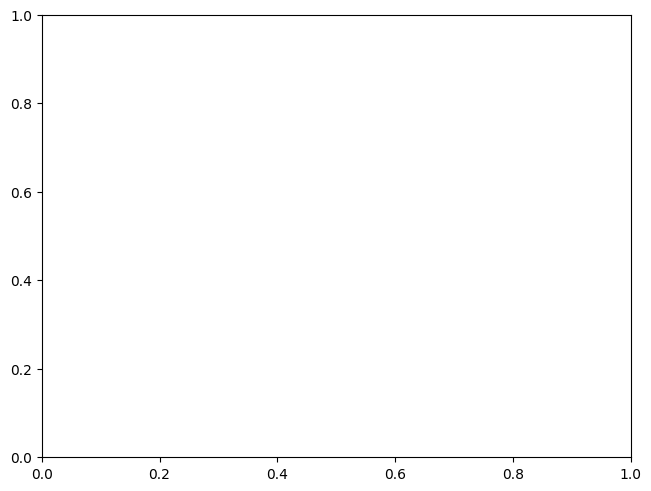

In [21]:
# sdata.pl.render_labels("cell_labels_right", color="disease").pl.show()
sdata.pl.render_shapes("cell_boundaries_right", color="disease").pl.show()

In [25]:
sdata['table'].obs['region'] = sdata['table'].obs['region'].astype('category')
sdata.write("sd_concat_filtered.zarr", overwrite=True)

INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside sd_concat_filtered.zarr). Please see the documentation of `is_self_contained()` to      
         understand the implications of working with SpatialData objects that are not self-contained.              
INFO     The Zarr backing store has been changed from sd_concat.zarr the new file path: sd_concat_filtered.zarr    


In [134]:
outdat = sdata['table'].copy()
outdat.X = adata.X

In [135]:
outdat.write_h5ad("xenium_filtered_moreAnnotated.h5ad")

# overview figures

In [2]:
import scanpy as sc

In [3]:
sdata = sd.read_zarr("sd_concat_filtered.zarr")
right = sd.read_zarr("right_data.zarr")
left = sd.read_zarr("left_data.zarr")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [4]:
adata = ad.read_h5ad("../11-Xenium_integration/xenium_filter_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 2405191 × 477
    obs: 'batch', 'Core', 'Size', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'leiden_res2', 'manual_celltype_annotation_leiden_broad', 'manual_celltype_annotation_leiden_broad_split_stromal', 'leiden_res5', 'final_annotation_leiden_res2_broad', 'final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid', 'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id', 'spatial_lda_kmeans', 'motif', 'ct_codex'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cod

In [44]:
codex = ad.read_h5ad("/mnt/isilon/cscb/Projects/codex/pillaiv/SCTC-VP-15/code/CD_analysis/aSMA_CD21_analysis/all_regions_dat.h5ad")
codex

AnnData object with n_obs × n_vars = 3895114 × 38
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'Reg', 'Tile.Row', 'Tile.Col', 'Tile.Z', 'In.Tile.Y', 'In.Tile.X', 'Absolute.Y', 'Absolute.X', 'Cell.Size', 'n_genes_by_counts', 'total_counts', 'nCount_raw', 'nFeature_raw', 'cell_type_pred_knn', 'cell_type_pred_knn_prob', 'motif', 'index_info', 'new_pheno', 'region'
    uns: 'lda_10', 'lda_10_probability', 'lda_12', 'lda_12_probability', 'lda_15', 'lda_15_probability', 'lda_8', 'lda_8_probability', 'spatial_lda', 'spatial_lda_probability'

In [121]:
codex.obs['sample'] = codex.obs.region.apply(lambda x: x.split("_")[0])
codex.obs.sample.head()

56787_MCD1_reg1    MCD1
56788_MCD1_reg1    MCD1
56790_MCD1_reg1    MCD1
56793_MCD1_reg1    MCD1
56798_MCD1_reg1    MCD1
Name: region, dtype: object

In [12]:
l = sdata['table'].obs.loc[sdata['table'].obs.region == "cell_boundaries_left", 
                           ['cell_id', 'ct_pred', 'core_id',"neigh_kmeans_fine", 'spatial_lda_kmeans', 'motif', 'ct_codex', 'sample_id', 'disease']]

left['table'].obs = pd.merge(left['table'].obs, l, on="cell_id", how="left")

In [13]:
# right['table'].obs.motif = right['table'].obs.motif.astype('category')
left['table'].obs.ct_codex = left['table'].obs.ct_codex.astype('category')
# right['table'].obs.ct_pred = right['table'].obs.ct_pred.astype('category')
# right['table'].obs.disease = right['table'].obs.disease.astype('category')
left['table'].obs.spatial_lda_kmeans = left['table'].obs.spatial_lda_kmeans.astype('category')
left['table'].obs.neigh_kmeans_fine = left['table'].obs.neigh_kmeans_fine.astype('category')

In [67]:
r = sdata['table'].obs.loc[sdata['table'].obs.region == "cell_boundaries_right", 
                           ['cell_id', 'ct_pred', 'core_id',"neigh_kmeans_fine", 'spatial_lda_kmeans', 'motif', 'ct_codex', 'sample_id', 'disease']]

right['table'].obs = pd.merge(right['table'].obs, r, on="cell_id", how="left")

In [68]:
# right['table'].obs.motif = right['table'].obs.motif.astype('category')
right['table'].obs.ct_codex = right['table'].obs.ct_codex.astype('category')
# right['table'].obs.ct_pred = right['table'].obs.ct_pred.astype('category')
# right['table'].obs.disease = right['table'].obs.disease.astype('category')
right['table'].obs.spatial_lda_kmeans = right['table'].obs.spatial_lda_kmeans.astype('category')
right['table'].obs.neigh_kmeans_fine = right['table'].obs.neigh_kmeans_fine.astype('category')

In [26]:
# ct_list = sdata['table'].obs.ct_codex.unique().tolist().sort()
# ct_list
sorted(sdata['table'].obs.ct_codex.unique().tolist())

['B_Cell',
 'CD4_T_Cell',
 'CD8_T_Cell',
 'Endothelial',
 'Lymphatics',
 'Macrophage',
 'Neutrophil',
 'Plasma_Cell',
 'Stromal',
 'Tfh',
 'Treg',
 'cDC1',
 'cDC2',
 'immune',
 'pDC']

## Cell typing figures

UCD = samples 18,20, cores 16, 18 (r)...36 (l)
MCD = cores 1,2,3* (r)


In [69]:
ct_names = ['B_Cell', 'CD4_T_Cell', 'Macrophage', 'CD8_T_Cell',
                  'Endothelial', 'Plasma_Cell', 'Stromal', 'pDC', 'cDC2',
                  'cDC1', 'Tfh', 'Lymphatics', 'myeloid', 'T_cell', 'immune',
                  'Neutrophil', 'Treg', 'Cytotoxic_T_Cell', 'Mast_Cell']
cell_col = ['#009933', '#FF6666', '#FFCC33', '#CC3333', '#333399', '#993399', '#FFFFFF', '#FF9933', '#FFFF66',
           '#CCCC66', '#FF9966', '#9966CC', '#FFCC00', '#FF3333', '#336633', '#99CC99', '#339999', '#CC3366', '#99CCCC']
ct_col_dict = dict(zip(ct_names, cell_col))
xen_ct_pl = sorted(sdata['table'].obs.ct_codex.unique().tolist())
cell_col_adjusted = [ct_col_dict[ct] for ct in xen_ct_pl]
cc_map = mpl.colors.ListedColormap(cell_col_adjusted, name="cell type")

In [17]:
left['table'].obs.ct_codex.unique()

[NaN, 'CD4_T_Cell', 'B_Cell', 'Stromal', 'pDC', ..., 'cDC2', 'Treg', 'immune', 'cDC1', 'Neutrophil']
Length: 16
Categories (15, object): ['B_Cell', 'CD4_T_Cell', 'CD8_T_Cell', 'Endothelial', ..., 'cDC1', 'cDC2', 'immune', 'pDC']

In [5]:
sdata['table']

AnnData object with n_obs × n_vars = 2405191 × 477
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels', 'cell_id_all', 'Core', 'Size', 'leiden', 'leiden_res2', 'manual_celltype_annotation_leiden_broad', 'manual_celltype_annotation_leiden_broad_split_stromal', 'leiden_res5', 'final_annotation_leiden_res2_broad', 'final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid', 'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id', 'spatial_lda_kmeans', 'motif', 'ct_codex', 'sample_id', 'disease'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [14]:
core_id = '36'
left['core_'+core_id+'_cells'] = left['cell_boundaries'].loc[(left['table'].obs.core_id==core_id).values]
left['core_'+core_id+'_cells']['motif_1'] = left['table'].obs.motif.loc[left['table'].obs.core_id==core_id].values
left['core_'+core_id+'_cells']['neigh_kmeans_fine_1'] = left['table'].obs.neigh_kmeans_fine.loc[left['table'].obs.core_id==core_id].values
left['core_'+core_id+'_cells']['spatial_lda_kmeans_1'] = left['table'].obs.spatial_lda_kmeans.loc[left['table'].obs.core_id==core_id].values
left['core_'+core_id+'_cells']['ct_codex_1'] = left['table'].obs.ct_codex.loc[left['table'].obs.core_id==core_id].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying t

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


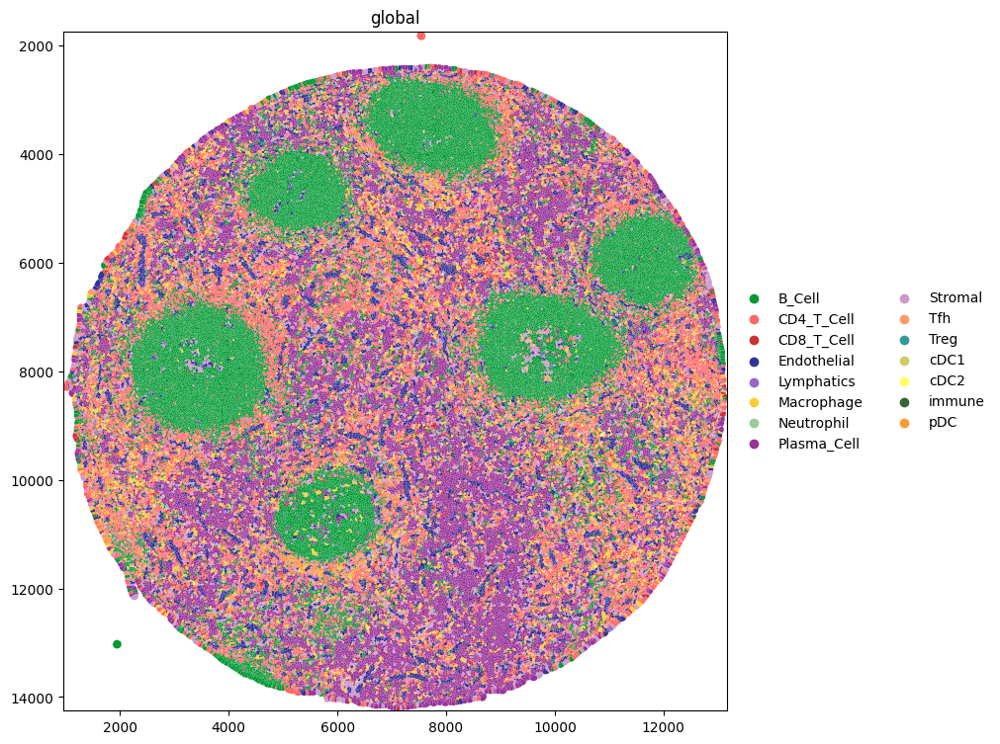

In [28]:
left.pl.render_shapes('core_'+core_id+'_cells', color="ct_codex_1", cmap=cc_map).pl.show(figsize=(10,10))

In [70]:
core_id = '16'
right['core_'+core_id+'_cells'] = right['cell_boundaries'].loc[(right['table'].obs.core_id==core_id).values]
right['core_'+core_id+'_cells']['motif_1'] = right['table'].obs.motif.loc[right['table'].obs.core_id==core_id].values
right['core_'+core_id+'_cells']['neigh_kmeans_fine_1'] = right['table'].obs.neigh_kmeans_fine.loc[right['table'].obs.core_id==core_id].values
right['core_'+core_id+'_cells']['spatial_lda_kmeans_1'] = right['table'].obs.spatial_lda_kmeans.loc[right['table'].obs.core_id==core_id].values
right['core_'+core_id+'_cells']['ct_codex_1'] = right['table'].obs.ct_codex.loc[right['table'].obs.core_id==core_id].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying t

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


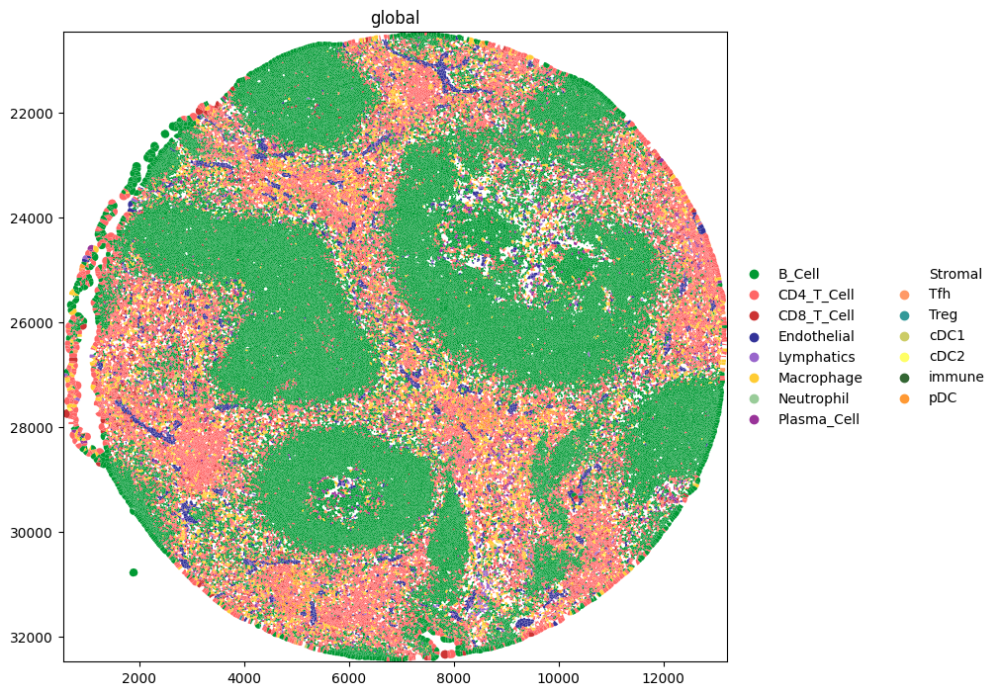

In [34]:
right.pl.render_shapes('core_'+core_id+'_cells', color="ct_codex_1", cmap=cc_map).pl.show(figsize=(10,10))
plt.savefig("outs/ct_cores/UCD_core_16.png")

In [87]:
core_id = '3'
right['core_'+core_id+'_cells'] = right['cell_boundaries'].loc[(right['table'].obs.core_id==core_id).values]
right['core_'+core_id+'_cells']['motif_1'] = right['table'].obs.motif.loc[right['table'].obs.core_id==core_id].values
right['core_'+core_id+'_cells']['neigh_kmeans_fine_1'] = right['table'].obs.neigh_kmeans_fine.loc[right['table'].obs.core_id==core_id].values
right['core_'+core_id+'_cells']['spatial_lda_kmeans_1'] = right['table'].obs.spatial_lda_kmeans.loc[right['table'].obs.core_id==core_id].values
right['core_'+core_id+'_cells']['ct_codex_1'] = right['table'].obs.ct_codex.loc[right['table'].obs.core_id==core_id].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying t

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


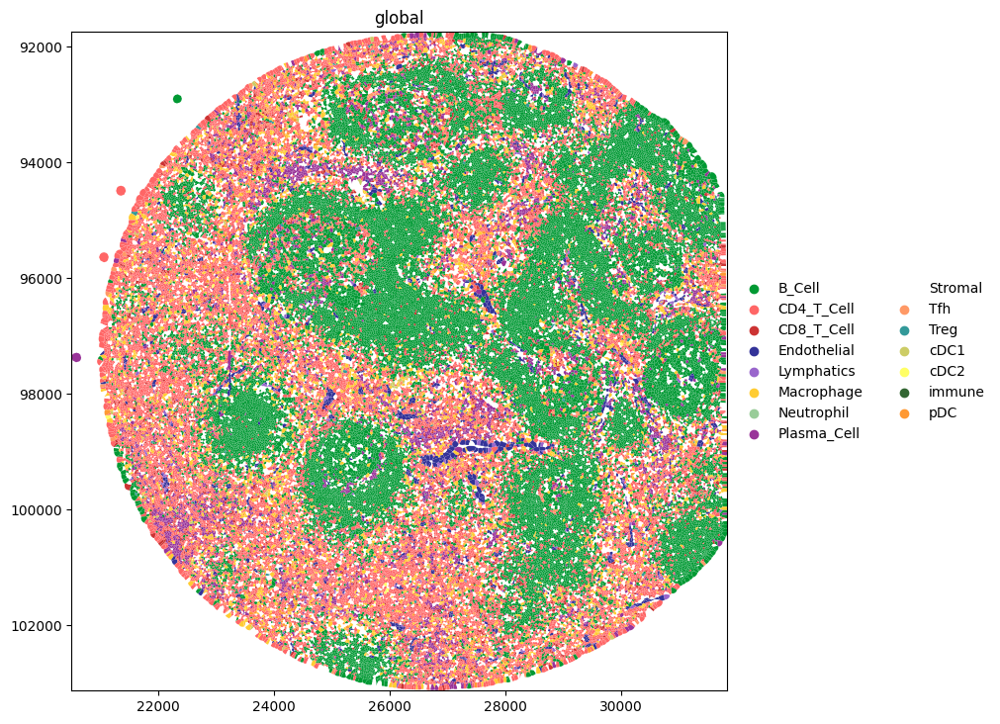

In [40]:
right.pl.render_shapes('core_'+core_id+'_cells', color="ct_codex_1", cmap=cc_map).pl.show(figsize=(10,10))
plt.savefig("outs/ct_cores/MCD_core_"+core_id+".png")

## Cell composition

stacked bar charts? maybe clustered by composition

In [112]:
pdata = sdata['table'].obs[['sample_id', 'ct_codex']].pivot_table(index='sample_id',columns='ct_codex', 
                                                      aggfunc=len, fill_value=0)
sort_i = pdata.apply(np.sum,axis=1).sort_values(ascending=False).index
pdata = pdata.loc[sort_i,]

/tmp/ipykernel_2116441/3695028563.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pdata = sdata['table'].obs[['sample_id', 'ct_codex']].pivot_table(index='sample_id',columns='ct_codex',


In [113]:
pdata=pdata.T / pdata.T.sum(axis=0)
pdata = pdata.T

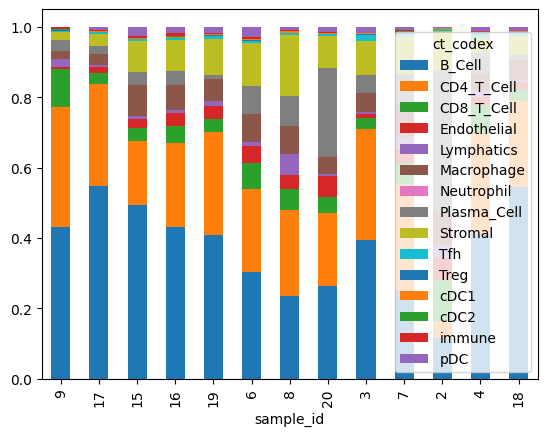

In [117]:
pdata.plot(kind='bar', stacked=True)
plt.savefig("outs/Xen_cell_comp_by_sample.pdf")

In [126]:
pdata = codex.obs[['sample', 'new_pheno']].pivot_table(index='sample',columns='new_pheno', 
                                                      aggfunc=len, fill_value=0)
pdata = pdata.loc[:, pdata.columns.isin(sdata['table'].obs.ct_codex.unique())]
sort_i = pdata.apply(np.sum,axis=1).sort_values(ascending=False).index
pdata = pdata.loc[sort_i,]
pdata=pdata.T / pdata.T.sum(axis=0)
pdata = pdata.T

/tmp/ipykernel_2116441/2386205405.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pdata = codex.obs[['sample', 'new_pheno']].pivot_table(index='sample',columns='new_pheno',


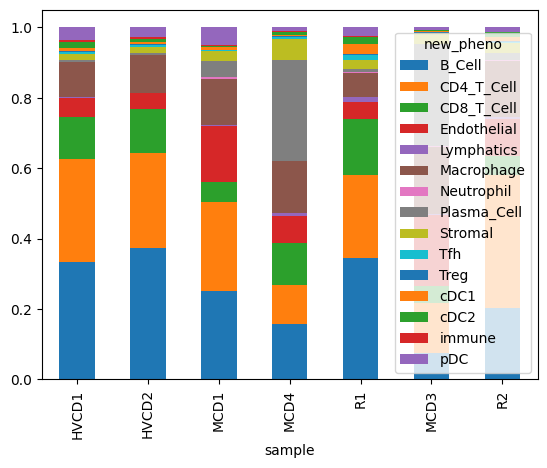

In [127]:
pdata.plot(kind='bar', stacked=True)
plt.savefig("outs/Codex_cell_comp_by_sample.pdf")

## Gene expression

cells of interest = "Fibroblastic stromal cell, type 2", "Fibroblastic stromal cell, type 1", "blood endothelial cell",
"ACTA2+ perivascular reticular cells", "Stromal cells", "FDC", "lymphatic endothelial cell"

plot IL6, VEGFA, VEGFB

IL-6 module = IL6, OSMR, IL6ST, LIFR, --IL6ST not in panel

In [5]:
sdata['table'].X = adata.X

In [9]:
[g for g in adata.var_names if 'IL6' in g]

['IL6', 'IL6R', 'vIL6']

In [130]:
print(sdata['table'].obs.shape)
print(sdata['table'].X.shape)
sdata['table'].obs.shape[0] == adata.obs.shape[0]

(2405191, 32)
(2405191, 477)


In [133]:
sdata['table'].obs.ct_pred.value_counts()

ct_pred
Naive B cells                          830343
Memory or effector T cells             513707
Plasma cells                           201167
Cytotoxic CD8 T cells                  142497
Fibroblastic stromal cell, type 2      134563
Monocytes                               98631
Naive CD4 and Naive CD8 T cells         94712
blood endothelial cell                  75633
Activated and memory B cells            75124
Fibroblastic stromal cell, type 1       51013
Macrophages                             49582
lymphatic endothelial cell              44427
Plasmacytoid dendritic cells            32393
T Follicular Helper cells               15897
NK cells                                 8108
Classic Dendritic cells                  6743
Stromal cells                            5611
ACTA2+ perivascular reticular cells      5419
FDC                                      5305
Germinal center B cells                  5127
Regulatory T cells                       3533
Activated and migratory cD

In [103]:
coi = ["Fibroblastic stromal cell, type 2", "Fibroblastic stromal cell, type 1", "blood endothelial cell","ACTA2+ perivascular reticular cells", "Stromal cells", "FDC", "lymphatic endothelial cell"]

In [152]:
len(coi)

7

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarni

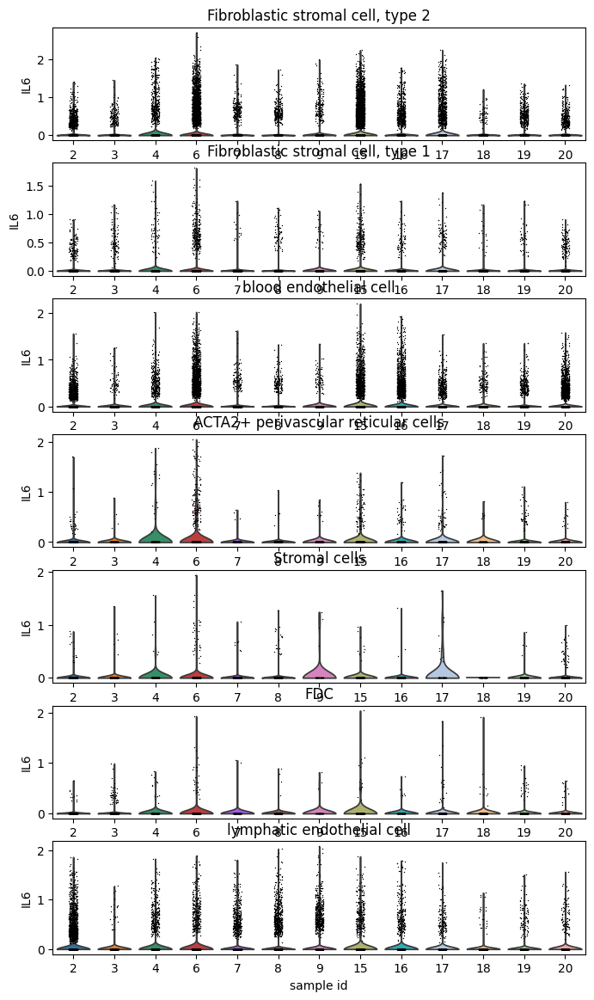

In [160]:
fig, axs = plt.subplots(nrows=len(coi), ncols=1, figsize=(8,14))
for i in range(len(coi)):
    sc.pl.violin(sdata['table'][sdata['table'].obs.ct_pred == coi[i],:], keys='IL6', groupby="sample_id", ax=axs[i], show=False)
    axs[i].set_title(coi[i])
plt.savefig("outs/violin_IL6_stromal.pdf")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarni

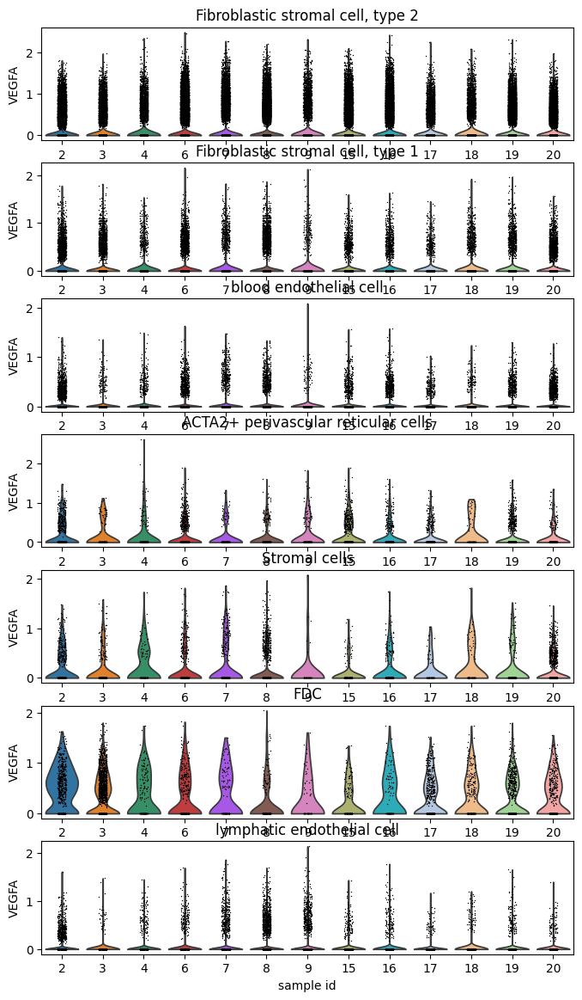

In [161]:
fig, axs = plt.subplots(nrows=len(coi), ncols=1, figsize=(8,14))
for i in range(len(coi)):
    sc.pl.violin(sdata['table'][sdata['table'].obs.ct_pred == coi[i],:], keys='VEGFA', groupby="sample_id", ax=axs[i], show=False)
    axs[i].set_title(coi[i])
plt.savefig("outs/violin_VEFA_stromal.pdf")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarni

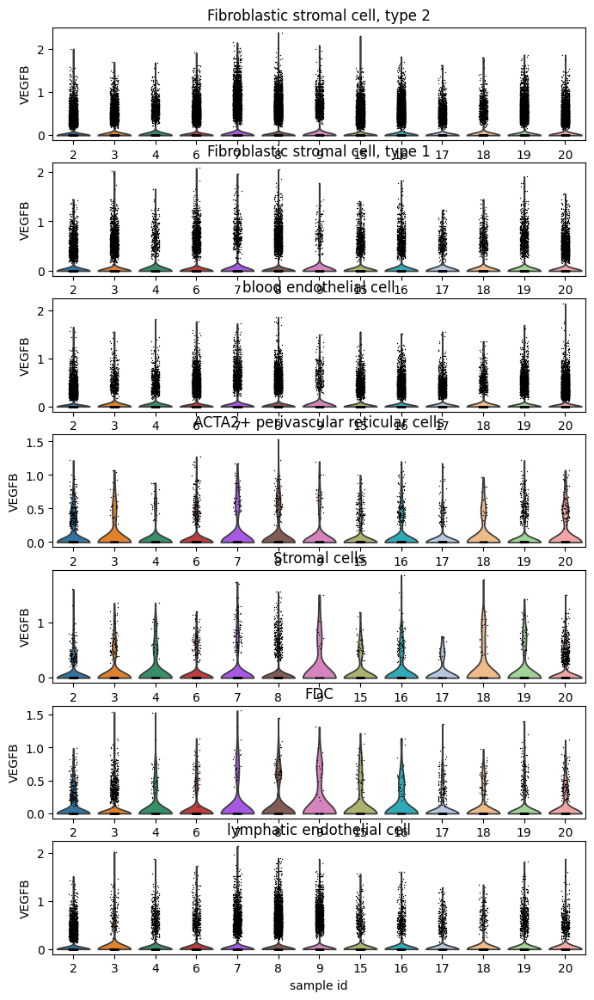

In [162]:
fig, axs = plt.subplots(nrows=len(coi), ncols=1, figsize=(8,14))
for i in range(len(coi)):
    sc.pl.violin(sdata['table'][sdata['table'].obs.ct_pred == coi[i],:], keys='VEGFB', groupby="sample_id", ax=axs[i], show=False)
    axs[i].set_title(coi[i])
plt.savefig("outs/violin_VEGFB_stromal.pdf")

### gene expression with metadata

In [7]:
meta = pd.read_csv("../../documents/metadata_simple.csv")
meta.set_index(meta.id_short.astype('str'), inplace=True)
# meta.head()

In [127]:
sdata_filter = sdata['table'].copy()
sc.pp.filter_cells(sdata_filter, min_counts=50)

In [107]:
p_col = meta.select_dtypes(include='number').columns

In [108]:
ct_counts = sdata['table'].obs.ct_pred.value_counts()
plotct = ct_counts.index[ct_counts > 1000]

In [115]:
for ct in plotct:
    pdata = sdata_filter.obs.copy()
    pdata['gene'] = sdata_filter[:,"IL6"].X.toarray()
    pdata = pdata.loc[pdata.ct_pred == ct].groupby("sample_id")['gene'].mean()
    pdata = pd.DataFrame(pdata).join(meta)
    
    fig, axs = plt.subplots(ncols=3, nrows=5, figsize=(10,12))
    axs = axs.ravel()
    for i in range(len(p_col)):
        # pdata.plot("gene", p_col[i], kind="scatter", hue='condition', ax=axs[i])
        sns.scatterplot(pdata, y="gene", x=p_col[i], hue='condition', ax=axs[i])
    for ax_i in range(len(p_col)):
        axs[ax_i].legend_.remove()

    # Add a single legend to the figure
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

    plt.tight_layout()
    plt.savefig("outs/metadata_scatters/IL6/"+ct+"filter.pdf", bbox_inches='tight')
    plt.close()

In [116]:
for ct in plotct:
    pdata = sdata_filter.obs.copy()
    pdata['gene'] = sdata_filter[:,"VEGFA"].X.toarray()
    pdata = pdata.loc[pdata.ct_pred == ct].groupby("sample_id")['gene'].mean()
    pdata = pd.DataFrame(pdata).join(meta)
    
    fig, axs = plt.subplots(ncols=3, nrows=5, figsize=(10,12))
    axs = axs.ravel()
    for i in range(len(p_col)):
        # pdata.plot("gene", p_col[i], kind="scatter", hue='condition', ax=axs[i])
        sns.scatterplot(pdata, y="gene", x=p_col[i], hue='condition', ax=axs[i])
    for ax_i in range(len(p_col)):
        axs[ax_i].legend_.remove()

    # Add a single legend to the figure
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

    plt.tight_layout()
    plt.savefig("outs/metadata_scatters/VEGFA/"+ct+"filter.pdf", bbox_inches='tight')
    plt.close()

In [133]:
# do the same thing but with a module score

# sc.tl.score_genes(sdata['table'], gene_list=["IL6","LIFR","OSMR"], score_name="IL6score")
sc.tl.score_genes(sdata_filter, gene_list=["IL6","LIFR","OSMR"], score_name="IL6score")
sdata_filter

AnnData object with n_obs × n_vars = 1187154 × 477
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels', 'cell_id_all', 'Core', 'Size', 'leiden', 'leiden_res2', 'manual_celltype_annotation_leiden_broad', 'manual_celltype_annotation_leiden_broad_split_stromal', 'leiden_res5', 'final_annotation_leiden_res2_broad', 'final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid', 'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id', 'spatial_lda_kmeans', 'motif', 'ct_codex', 'sample_id', 'disease', 'condition', 'IL6score', 'n_counts'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [118]:
pdata_ = sdata_filter.obs.copy()

In [119]:
for ct in plotct:
    pdata = pdata_.loc[pdata_.ct_pred == ct].groupby("sample_id")['IL6score'].mean()
    pdata = pd.DataFrame(pdata).join(meta)
    
    fig, axs = plt.subplots(ncols=3, nrows=5, figsize=(10,12))
    axs = axs.ravel()
    for i in range(len(p_col)):
        # pdata.plot("gene", p_col[i], kind="scatter", hue='condition', ax=axs[i])
        sns.scatterplot(pdata, y="IL6score", x=p_col[i], hue='condition', ax=axs[i])
    for ax_i in range(len(p_col)):
        axs[ax_i].legend_.remove()

    # Add a single legend to the figure
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

    plt.tight_layout()
    plt.savefig("outs/metadata_scatters/IL6_score/"+ct+"filter.pdf", bbox_inches='tight')
    plt.close()

In [138]:
sdata_filter_sub = sc.pp.subsample(sdata_filter, fraction=0.25, copy=True)

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarni

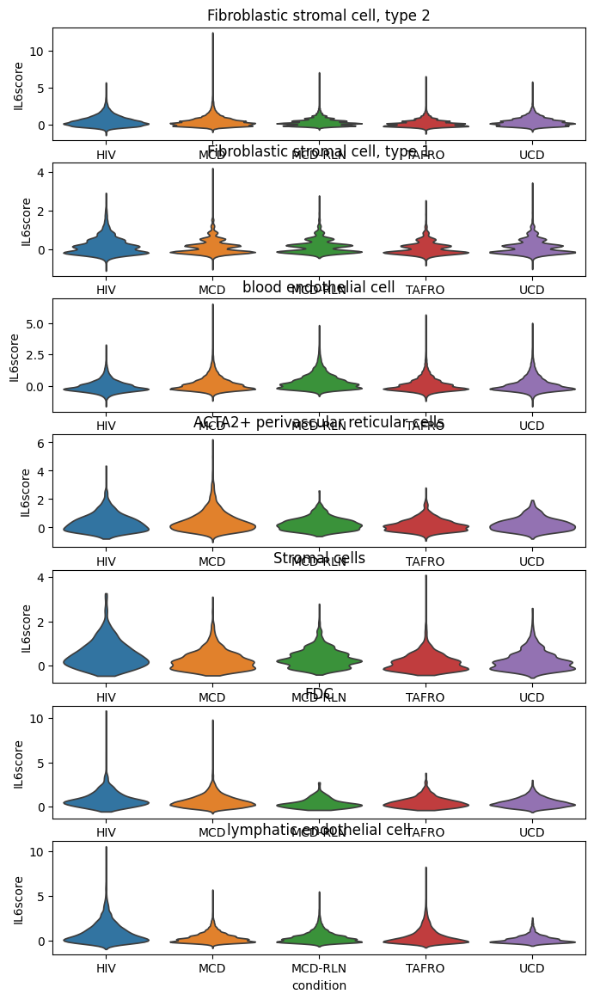

In [128]:

fig, axs = plt.subplots(nrows=len(coi), ncols=1, figsize=(8,14))
for i in range(len(coi)):
    # sc.pl.violin(sdata['table'][sdata['table'].obs.ct_pred == coi[i],:], keys='IL6score', groupby="sample_id", ax=axs[i], show=False)
    sc.pl.violin(sdata_filter[sdata_filter.obs.ct_pred == coi[i],:], keys='IL6score', groupby="condition", 
                 # jitter=0.3,
                 size=0,
                 ax=axs[i], show=False)
    axs[i].set_title(coi[i])
plt.savefig("outs/violin_IL6score_stromal_groupCondition_noPoints.pdf")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarni

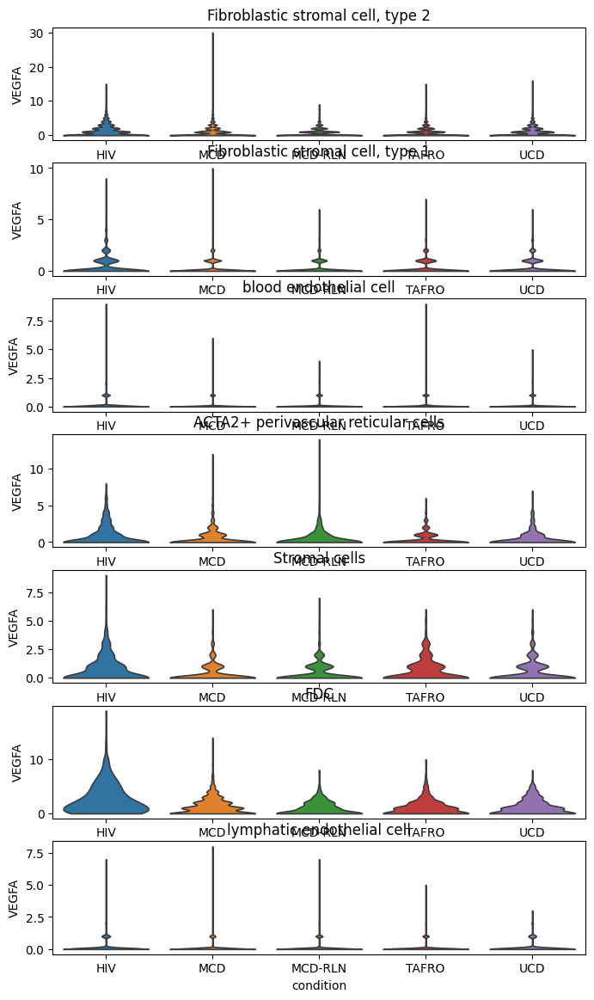

In [129]:

fig, axs = plt.subplots(nrows=len(coi), ncols=1, figsize=(8,14))
for i in range(len(coi)):
    # sc.pl.violin(sdata['table'][sdata['table'].obs.ct_pred == coi[i],:], keys='IL6score', groupby="sample_id", ax=axs[i], show=False)
    sc.pl.violin(sdata_filter[sdata_filter.obs.ct_pred == coi[i],:], keys='VEGFA', groupby="condition", 
                 # jitter=0.3,
                 size=0,
                 ax=axs[i], show=False)
    axs[i].set_title(coi[i])
plt.savefig("outs/violin_VEGFA_stromal_groupCondition_noPoints.pdf")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


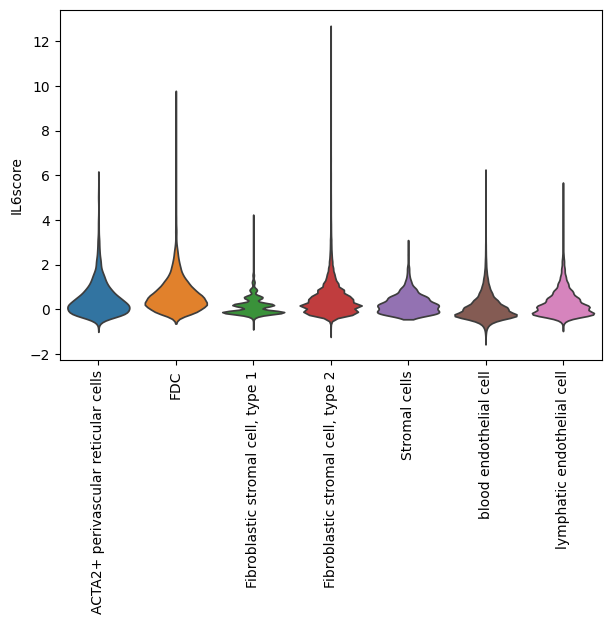

In [144]:
pdata = sdata_filter[sdata_filter.obs.ct_pred.isin(coi),:]
sc.pl.violin(pdata[pdata.obs.condition == "MCD",:], keys='IL6score', groupby="ct_pred", 
                 # jitter=0.3,
                 stripplot=False, 
             show=False, rotation=90)
plt.savefig("outs/violin_IL6_subsetMCD_groupCellType_noPoints.pdf", bbox_inches="tight")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


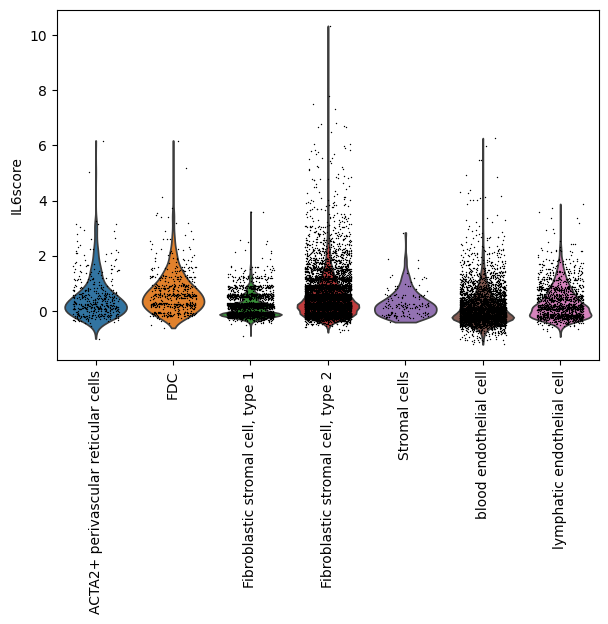

In [145]:
pdata = sdata_filter_sub[sdata_filter_sub.obs.ct_pred.isin(coi),:]
sc.pl.violin(pdata[pdata.obs.condition == "MCD",:], keys='IL6score', groupby="ct_pred", 
                 jitter=0.3,
                 # size=0, 
             show=False, rotation=90)
plt.savefig("outs/violin_IL6_subsetMCD_groupCellType.pdf", bbox_inches="tight")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


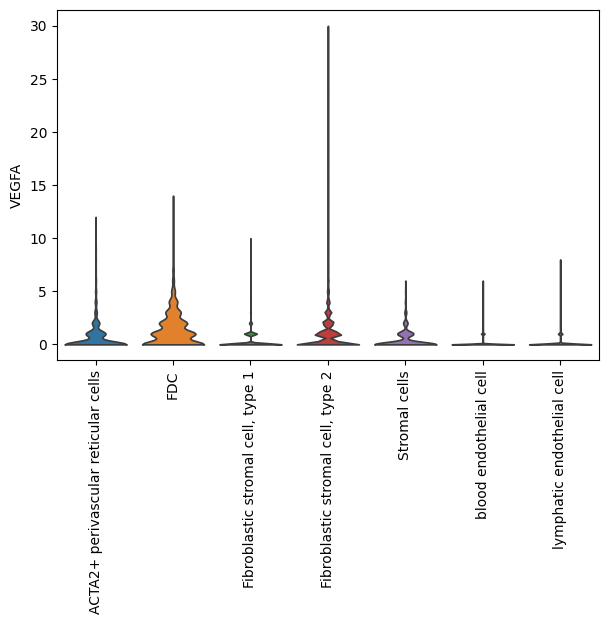

In [146]:
pdata = sdata_filter[sdata_filter.obs.ct_pred.isin(coi),:]
sc.pl.violin(pdata[pdata.obs.condition == "MCD",:], keys='VEGFA', groupby="ct_pred", 
                 # jitter=0.3,
                 stripplot=False, 
             show=False, rotation=90)
plt.savefig("outs/violin_VEGFA_subsetMCD_groupCellType_noPoints.pdf", bbox_inches="tight")

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


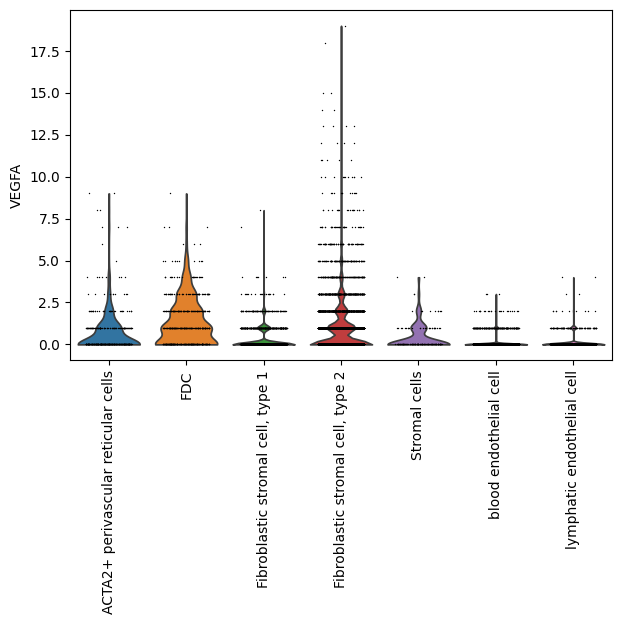

In [147]:
pdata = sdata_filter_sub[sdata_filter_sub.obs.ct_pred.isin(coi),:]
sc.pl.violin(pdata[pdata.obs.condition == "MCD",:], keys='VEGFA', groupby="ct_pred", 
                 jitter=0.3,
                 # size=0, 
             show=False, rotation=90)
plt.savefig("outs/violin_VEGFA_subsetMCD_groupCellType.pdf", bbox_inches="tight")

### gene expression in space?

Samples 6, 15, 17 could be interesting

cores: 4,5

In [163]:
sdata

SpatialData object, with associated Zarr store: /mnt/isilon/cscb/Projects/10x_xenium/pillaiv/code/replicated_analysis/sd_concat_filtered.zarr
├── Images
│     ├── 'morphology_focus_left': DataTree[cyx] (1, 98717, 48379), (1, 49358, 24189), (1, 24679, 12094), (1, 12339, 6047), (1, 6169, 3023)
│     ├── 'morphology_focus_right': DataTree[cyx] (1, 105304, 48778), (1, 52652, 24389), (1, 26326, 12194), (1, 13163, 6097), (1, 6581, 3048)
│     ├── 'morphology_mip_left': DataTree[cyx] (1, 98717, 48379), (1, 49358, 24189), (1, 24679, 12094), (1, 12339, 6047), (1, 6169, 3023)
│     └── 'morphology_mip_right': DataTree[cyx] (1, 105304, 48778), (1, 52652, 24389), (1, 26326, 12194), (1, 13163, 6097), (1, 6581, 3048)
├── Labels
│     ├── 'cell_labels_left': DataTree[yx] (98717, 48379), (49358, 24189), (24679, 12094), (12339, 6047), (6169, 3023)
│     ├── 'cell_labels_right': DataTree[yx] (105304, 48778), (52652, 24389), (26326, 12194), (13163, 6097), (6581, 3048)
│     ├── 'nucleus_labels_left': Dat

In [164]:
sdata['transcripts_right'].shape

(Delayed('int-c473152c-f077-4971-a88d-2392988bbd94'), 10)

In [189]:
gene = "IL6"
# right['core_4_cells'] = right['cell_boundaries'].loc[(right['table'].obs.core_id=="4").values]
# right['core_13_cells']['motif_1'] = adata.obs.motif.loc[adata.obs.core_id=='4'].values
# right['core_13_cells']['spatial_lda_kmeans_1'] = adata.obs.spatial_lda_kmeans.loc[adata.obs.core_id=='4'].values
# right['core_13_cells']['ct_codex_1'] = adata.obs.ct_codex.loc[adata.obs.core_id=='4'].values
right['core_4_cells']['gene_1'] = adata.X[adata.obs.core_id=='4',adata.var_names==gene].tolist()[0]

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


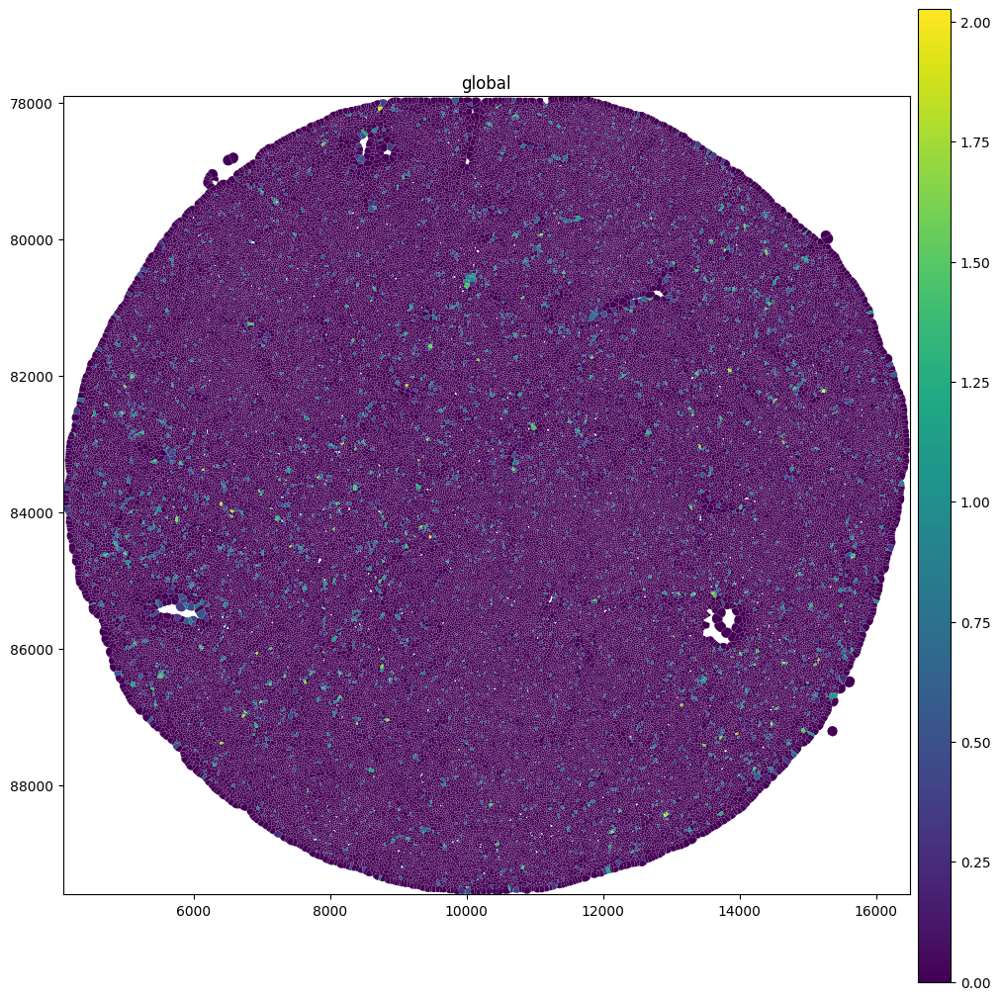

In [190]:
right.pl.render_shapes('core_4_cells', color="gene_1").pl.show(figsize=(10,10))

## neighborhood analysis

Converting the motifs....

\[xenium\] --- \[codex\]

2 --- 2, B cell follicle
0 --- 3, interfoll. T-Mac
1,9 --- 10, plasma cell zone
3 --- 1, interfol. CD4
8 --- 6, interfoll. pDC
10 --- 4, rare foll. stroma
7, 6 --- 11. foll. stroma
4 --- 0, mantle zone
5 --- 5, intferfoll. T-DC
11 --- 7, HEV

In [4]:
adata = ad.read_h5ad("../11-Xenium_integration/xenium_filter_annotated_checkpoint.h5ad")
adata.obs.shape

(2405191, 41)

In [49]:
# sdata['table'].obs['spatial_lda_kmeans'].iloc[0:5]
motif_rename_dict = {'2':'2',
                    '0':'3',
                    '1':'10',
                    '9':'10',
                    '3':'1',
                    '8':'6',
                    '10':'4',
                    '7':'11',
                    '6':'11',
                    '4':'0',
                    '5':'5',
                    '11':'7'}
sdata['table'].obs['motif_rename'] = sdata['table'].obs['spatial_lda_kmeans'].apply(lambda s: 'Motif_'+motif_rename_dict[s])
sdata['table'].obs['motif_rename'].iloc[0:5]

0     Motif_5
1     Motif_5
2    Motif_11
3    Motif_11
4    Motif_11
Name: motif_rename, dtype: object

In [80]:
# col_list = ["#990000", "#e37870", "#f63b32", "#52bcd4", "#cccc66", "#679c40", "#005487", "#1c0608", 
#             "#002B52", "#f3fbfb", "#f3ff41", "#666600"]

# from illustrator
col_list = ["#991B1E", "#CC6666", "#EF3B39", "#69C9CA", "#CCCC64", "#669940", "#016699", "#2F1110", 
            "#FFFFFF", "#1C3664", "#F7ED38", "#66672C"]
motif_colors = {codex.obs.motif.unique().sort_values()[i]:col_list[i] for i in range(codex.obs.motif.nunique())}
# ct_col_dict = dict(zip(ct_names, cell_col))
xen_ct_pl = sorted(sdata['table'].obs.motif_rename.unique().tolist())
cell_col_adjusted = [motif_colors[ct] for ct in xen_ct_pl]
cc_map = mpl.colors.ListedColormap(cell_col_adjusted, name="motif")

In [73]:
r = sdata['table'].obs.loc[sdata['table'].obs.region == "cell_boundaries_right", 
                           ['motif_rename', 'cell_id']]

right['table'].obs = pd.merge(right['table'].obs, r, on="cell_id", how="left")
right['table'].obs.motif_rename = right['table'].obs.motif_rename.astype('category')

In [77]:
right['table'].obs.motif_rename.iloc[0:5]

0     Motif_5
1     Motif_5
2    Motif_11
3    Motif_11
4    Motif_11
Name: motif_rename, dtype: category
Categories (10, object): ['Motif_0', 'Motif_1', 'Motif_10', 'Motif_11', ..., 'Motif_4', 'Motif_5', 'Motif_6', 'Motif_7']

In [78]:
# UCD
core_id = '16'
right['core_'+core_id+'_cells']['motif_rename'] = right['table'].obs.motif_rename.loc[right['table'].obs.core_id==core_id].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


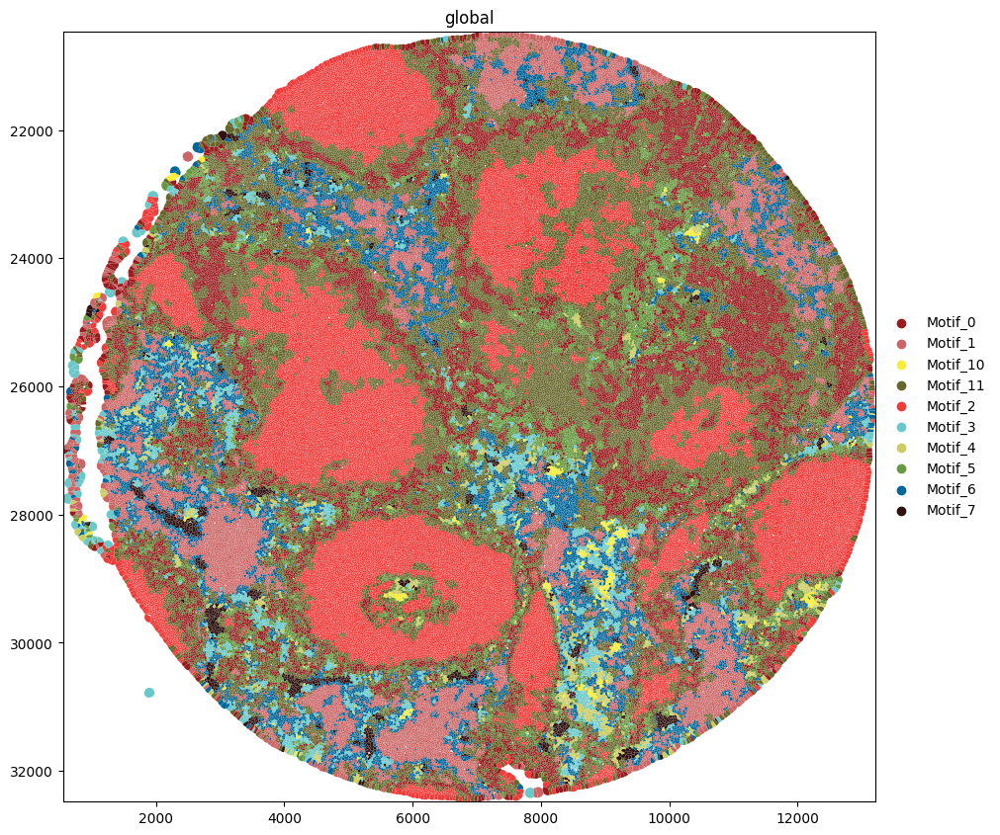

In [81]:
right.pl.render_shapes('core_'+core_id+'_cells', color="motif_rename", cmap=cc_map).pl.show(figsize=(10,10))
plt.savefig("outs/motif_cores/MCD_core_"+core_id+".png")

In [92]:
# MCD, 1,2,3
core_id = '2'
# right['core_'+core_id+'_cells']['motif_rename'] = right['table'].obs.motif_rename.loc[right['table'].obs.core_id==core_id].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


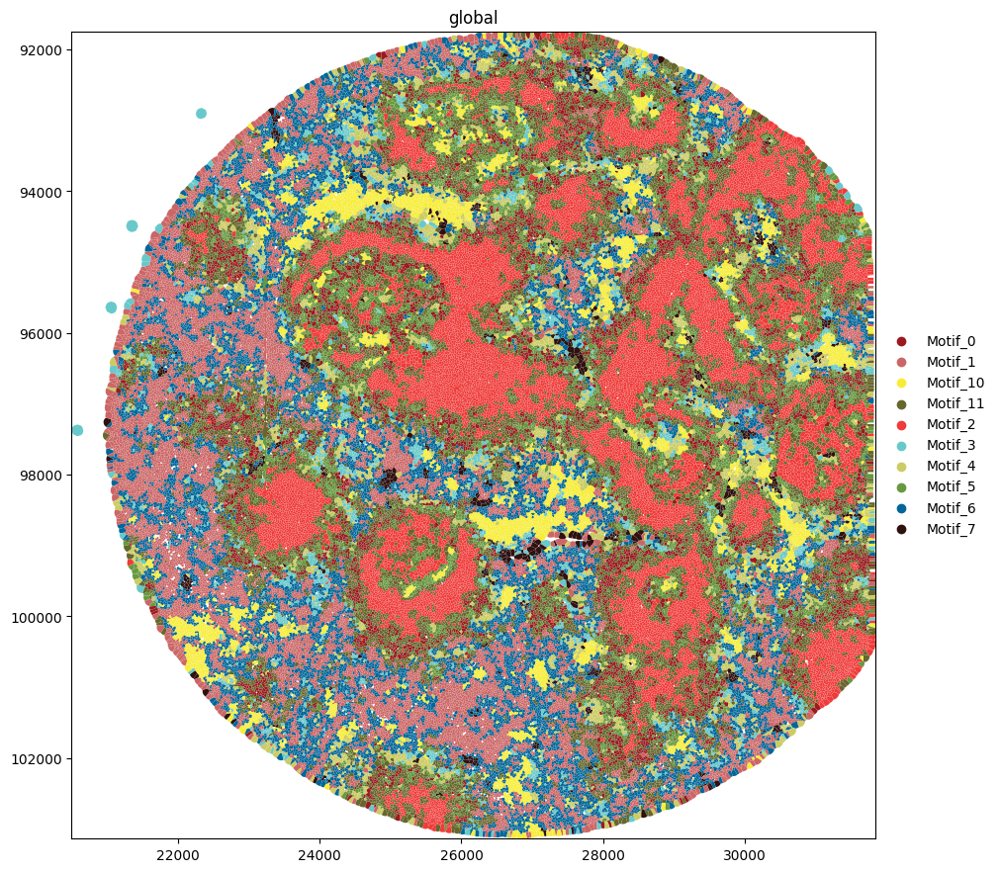

In [93]:
right.pl.render_shapes('core_'+core_id+'_cells', color="motif_rename", cmap=cc_map).pl.show(figsize=(10,10))
plt.savefig("outs/motif_cores/MCD_core_"+core_id+".png")

In [99]:
# RLN-like
right['core_9_cells'] = right['cell_boundaries'].loc[(right['table'].obs.core_id=="9").values]
right['core_9_cells']['motif_1'] = right['table'].obs.motif.loc[right['table'].obs.core_id=='9'].values
right['core_9_cells']['neigh_kmeans_fine_1'] = right['table'].obs.neigh_kmeans_fine.loc[right['table'].obs.core_id=='9'].values
right['core_9_cells']['spatial_lda_kmeans_1'] = right['table'].obs.spatial_lda_kmeans.loc[right['table'].obs.core_id=='9'].values
right['core_9_cells']['ct_codex_1'] = right['table'].obs.ct_codex.loc[right['table'].obs.core_id=='9'].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying t

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


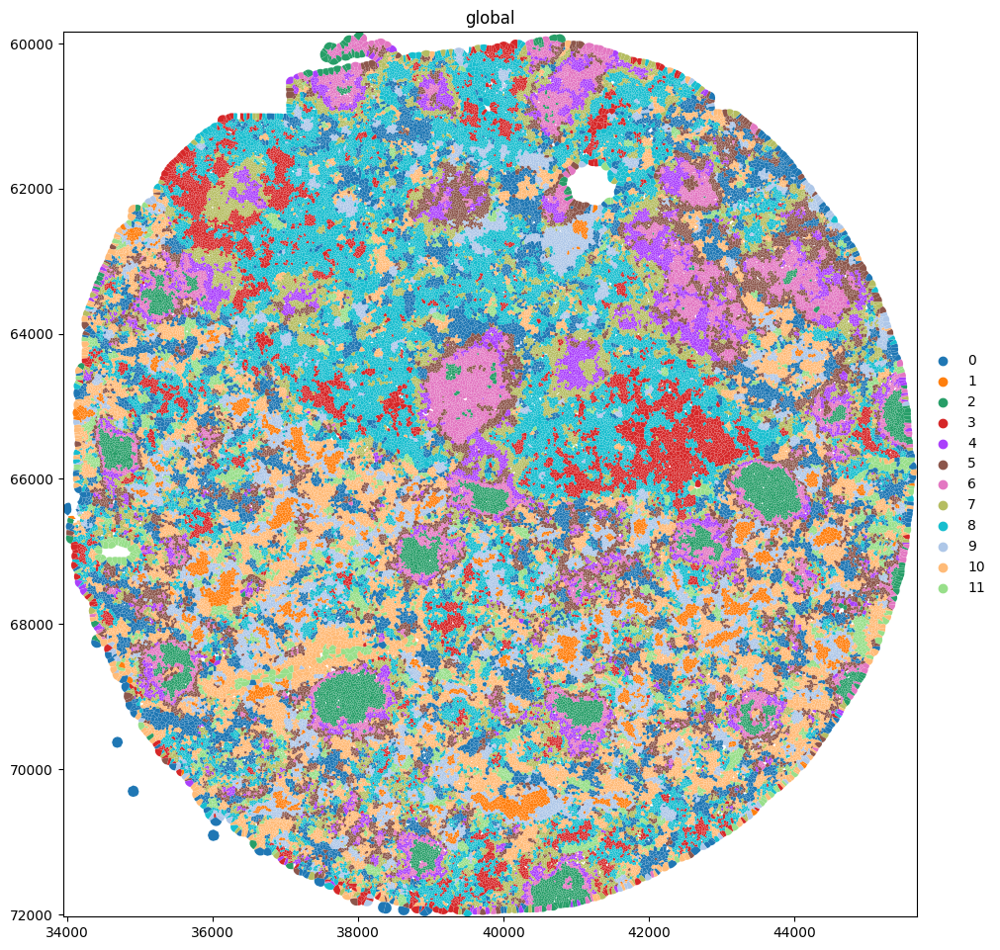

In [100]:
right.pl.render_shapes('core_9_cells', color="spatial_lda_kmeans_1").pl.show(figsize=(10,10))

In [101]:
# UCD
right['core_16_cells'] = right['cell_boundaries'].loc[(right['table'].obs.core_id=="16").values]
right['core_16_cells']['motif_1'] = right['table'].obs.motif.loc[right['table'].obs.core_id=='16'].values
right['core_16_cells']['neigh_kmeans_fine_1'] = right['table'].obs.neigh_kmeans_fine.loc[right['table'].obs.core_id=='16'].values
right['core_16_cells']['spatial_lda_kmeans_1'] = right['table'].obs.spatial_lda_kmeans.loc[right['table'].obs.core_id=='16'].values
right['core_16_cells']['ct_codex_1'] = right['table'].obs.ct_codex.loc[right['table'].obs.core_id=='16'].values

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying t

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)


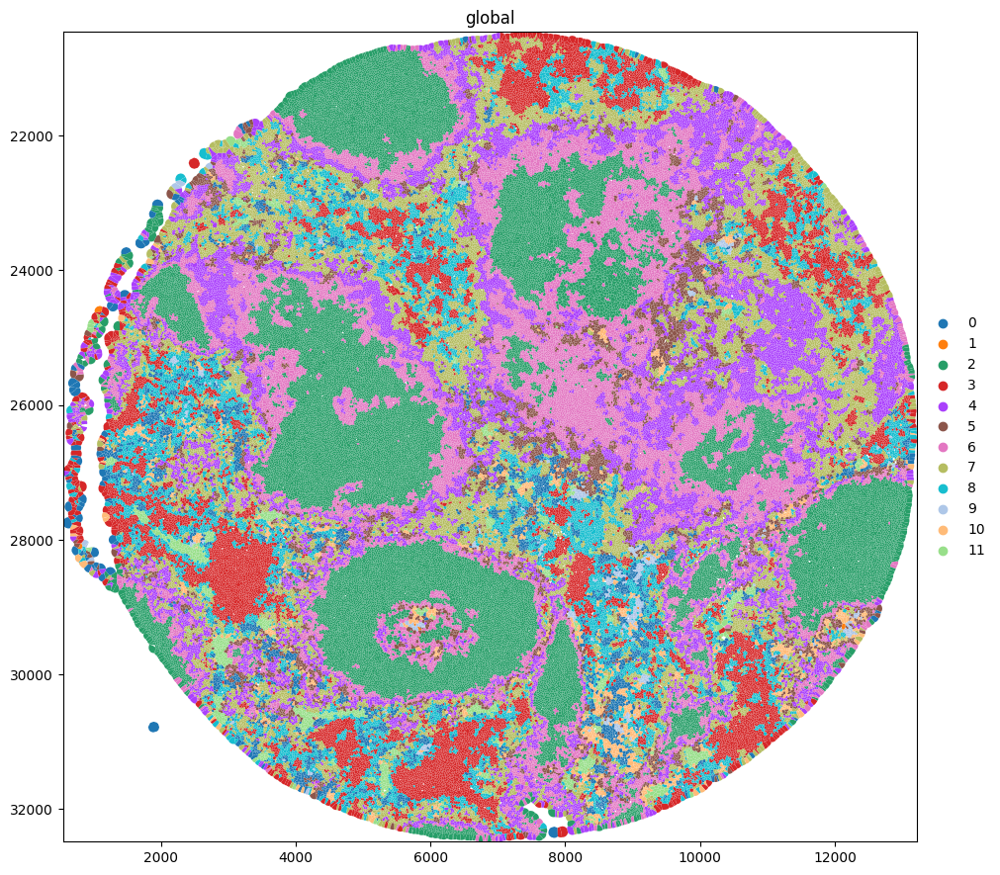

In [102]:
right.pl.render_shapes('core_16_cells', color="spatial_lda_kmeans_1").pl.show(figsize=(10,10))

## Stromal subset

In [8]:
meta = pd.read_csv("../../documents/metadata_simple.csv")
meta.set_index(meta.id_short.astype('str'), inplace=True)
meta.head()

,ID,id_short,TAFRO,ECOG_SCORE,Treatment1,Treatment_Response,PFS_months,OS_years,Status,wbc,...,Hemoglobin,Platelet_count,Neutrophile_count,lyphocytes_count,Gender,Age,IgA,IgG,IgM,condition
id_short,,,,,,,,,,,,,,,,,,,,,
1,TMA-H-01,1,NO,1,SURGERY,CR,83,83,ALIVE,5.1,...,12.2,278,4.8,1.7,F,55,166.0,1200.0,144.0,drop
2,TMA-H-02,2,NO,1,RITUXIMAB,CR,63,63,ALIVE,5.4,...,10.5,182,4.8,1.5,F,50,NaN,NaN,NaN,HIV
3,TMA-H-03,3,NO,1,RITUXIMAB,SD,2,79,ALIVE,5.4,...,10.5,182,4.8,1.5,M,61,NaN,NaN,NaN,MCD
4,TMA-H-04,4,NO,1,SURGERY,CR,84,84,ALIVE,5.6,...,14.0,353,4.5,0.5,F,65,244.0,661.0,105.0,MCD-RLN
5,TMA-H-05,5,NO,0,SURGERY,CR,78,78,ALIVE,4.9,...,15.0,196,3.9,0.5,M,66,NaN,NaN,NaN,drop


In [12]:
sdata['table'].obs['condition'] = sdata['table'].obs.sample_id.apply(lambda x: meta['condition'].loc[x])

In [51]:
# stroma = sdata['table'][sdata['table'].obs['ct_codex'].isin(['Stromal','Lymphatics','Endothelial']),:].copy()

stroma_ct = ['ACTA2+ perivascular reticular cells', 'FDC',
       'Fibroblastic stromal cell, type 1',
       'Fibroblastic stromal cell, type 2', 'blood endothelial cell',
       'lymphatic endothelial cell']
stroma = sdata['table'][sdata['table'].obs['ct_pred'].isin(stroma_ct),:].copy()

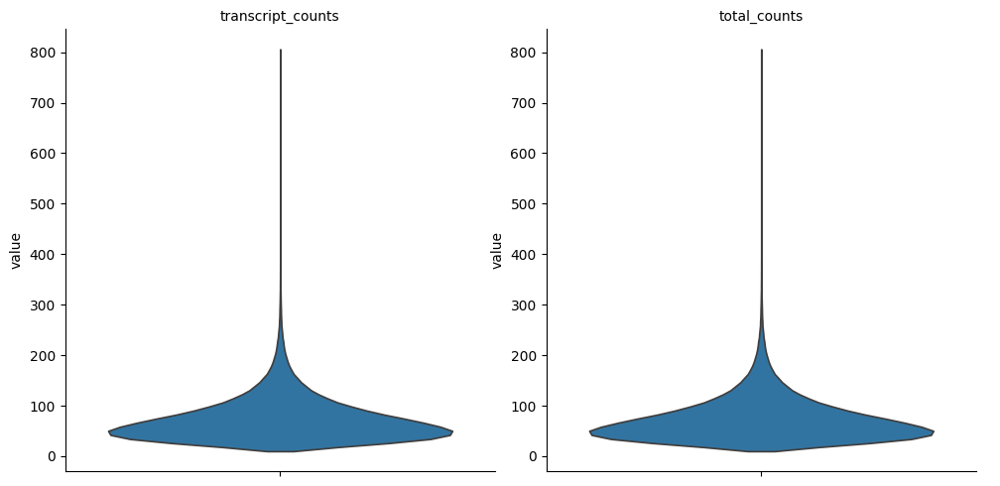

In [42]:
sc.pl.violin(
    stroma,
    ["transcript_counts", "total_counts"],
    # jitter=0.4,
    multi_panel=True,
    size=0
)

In [52]:
sc.pp.filter_cells(stroma, min_counts=50)

In [53]:
sc.tl.pca(stroma)
sc.pp.neighbors(stroma)
# sc.tl.umap(stroma)
sc.tl.umap(stroma, min_dist=0.1, spread=2)

In [61]:
# stroma.obs.ct_pred.cat.categories
# PRC, FDC, FSC1, FSC2, BEC, LEC
col_list = ["#2F67B2", "#319966", "#CC3333", "#669999", "#666699", "#CB9831"]
stroma_cols = dict(zip(stroma.obs.ct_pred.cat.categories, col_list))
# cc_map = mpl.colors.ListedColormap(col_list, name="stroma")

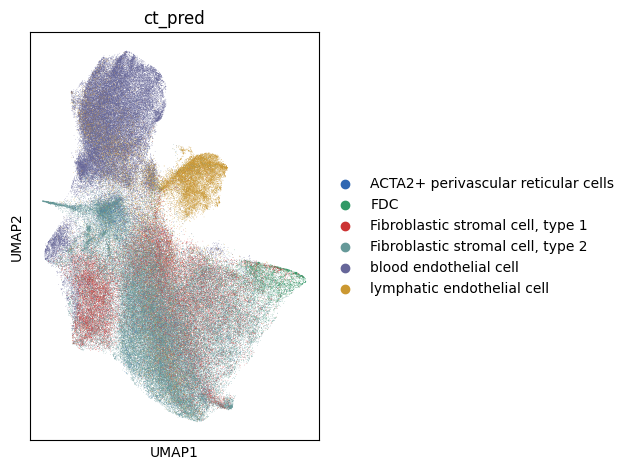

In [86]:
sc.pl.umap(stroma, color=["ct_pred"], palette=stroma_cols, show=False)
plt.tight_layout()
plt.savefig("outs/stromal_cells/full_umap.png", bbox_inches="tight")

In [71]:
stroma.obs.condition.value_counts()

condition
MCD        70946
TAFRO      49773
MCD-RLN    33895
HIV        27285
UCD        26898
Name: count, dtype: int64

In [93]:
sc.tl.embedding_density(stroma, basis='umap', groupby='condition')

/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/smithd30/miniconda3/envs/spatialdata/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_

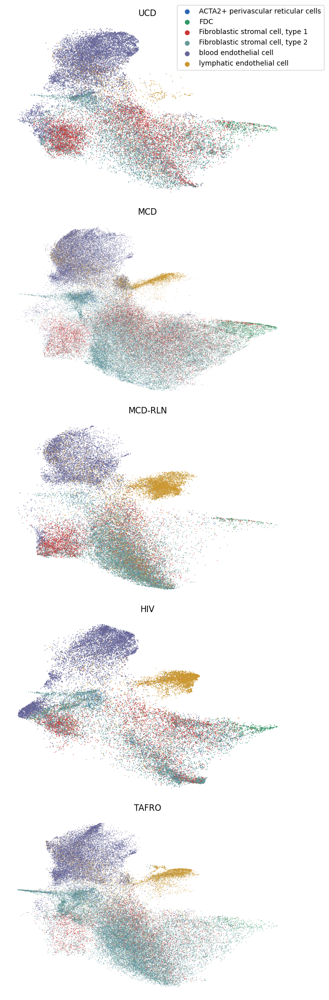

In [85]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(6,20))
axes = axes.ravel()
pl_cond = stroma.obs.condition.unique()
for i in range(len(pl_cond)):
    sc.pl.umap(stroma[stroma.obs.condition==pl_cond[i],:], 
               color=["ct_pred"], palette=stroma_cols, title=pl_cond[i],
               show=False, frameon=False, ax=axes[i])
for ax_i in range(len(pl_cond)):
        axes[ax_i].legend_.remove()

# Add a single legend to the figure
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.tight_layout()
plt.savefig("outs/stromal_cells/condition_umaps.png", bbox_inches="tight")

In [90]:
stroma

AnnData object with n_obs × n_vars = 208797 × 477
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels', 'cell_id_all', 'Core', 'Size', 'leiden', 'leiden_res2', 'manual_celltype_annotation_leiden_broad', 'manual_celltype_annotation_leiden_broad_split_stromal', 'leiden_res5', 'final_annotation_leiden_res2_broad', 'final_annotation_leiden_res2_fine', 'X_centroid', 'Y_centroid', 'neigh_kmeans', 'neigh_kmeans_fine', 'ct_pred', 'core_id', 'spatial_lda_kmeans', 'motif', 'ct_codex', 'sample_id', 'disease', 'condition', 'n_counts', 'umap_density_ct_pred'
    uns: 'spatialdata_attrs', 'pca', 'neighbors', 'umap', 'ct_pred_colors', 'umap_density_ct_pred_params'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/tmp/ipykernel_3515543/4157897306.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


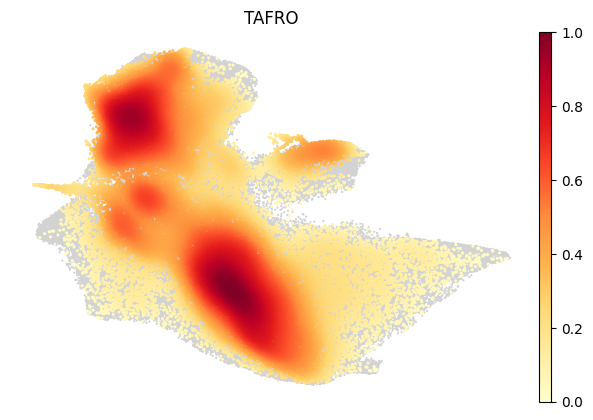

In [101]:
i = 4
pl_cond = stroma.obs.condition.unique()
sc.pl.embedding_density(stroma,
                            basis='umap', key='umap_density_condition',
                        bg_dotsize = 10,
                        fg_dotsize= 20,
               group=pl_cond[i], title=pl_cond[i],
               show=False, frameon=False)
plt.tight_layout()
plt.savefig("outs/stromal_cells/condition_density_"+pl_cond[i]+".png", bbox_inches="tight")

In [80]:
# the marker list plot...
all_markers = set(['PDGFRA', 'PDGFRB', 'CXCL13', 'APOE', 'CCL21', 'CCL19', 'PDPN',
                    'CDH5', 'ENG', 'CD34', 'PECAM1',
                    'PROX1', 'PECAM1', 'PDPN',
                    'ACTA2', 'TAGLN', 'TPM2', 'PDGFRB',
                    'ACTA2', 'MYH11', 'MCAM',
                    'CCL19', 'CCL21', 'CXCL12', 'CXCL9',
                    'LUM', 'DCN', 'PDPN', 'PDGFRA',
                    'CXCL13', 'CLU', 'FDCSP', 'DES'])
s_markers = [m for m in all_markers if m in stroma.var_names]
s_markers

['MYH11',
 'CD34',
 'PDGFRA',
 'CXCL12',
 'CXCL13',
 'CLU',
 'CCL21',
 'PECAM1',
 'CXCL9',
 'PDGFRB',
 'ACTA2',
 'CCL19',
 'DES',
 'PROX1',
 'PDPN']

/tmp/ipykernel_3515543/2599484035.py:2: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


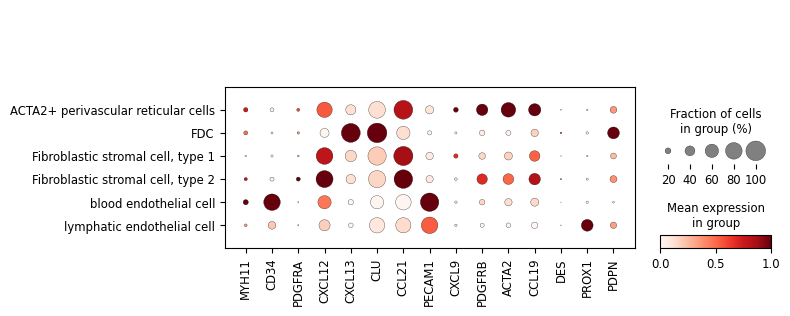

In [84]:
sc.pl.dotplot(stroma, s_markers, groupby="ct_pred", standard_scale="var", show=False)
plt.tight_layout()
plt.savefig("outs/stromal_cells/dotplot_markergenes.pdf", bbox_inches="tight")

## (Pre)processing

nvm...just using the data processed previously

In [98]:
adata.obs.head()

,batch,Core,Size,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,core_id,spatial_lda_kmeans,motif,ct_codex,sample_id,disease,slide,cluster_kmeans_scimap,cluster_phenograph,cluster_kmeans_new_lda
aaaaaocf-1-0,0,16,44.56,34,0,0,0,0,34.0,46.827033,...,16,6,Motif_11,Stromal,18,UCD,2,5,85,6
aaaabbjh-1-0,0,16,50.78,48,0,0,0,0,48.0,53.013439,...,16,6,Motif_11,CD4_T_Cell,18,UCD,2,5,424,8
aaaacchj-1-0,0,16,47.98,56,0,0,0,0,56.0,51.252346,...,16,9,Motif_9,Stromal,18,UCD,2,7,782,2
aaaacdao-1-0,0,16,128.74,170,0,0,0,0,170.0,132.172349,...,16,9,Motif_9,B_Cell,18,UCD,2,7,455,6
aaaaclmo-1-0,0,16,47.82,45,0,0,0,0,45.0,50.439533,...,16,6,Motif_11,Lymphatics,18,UCD,2,7,402,8
